# Projet PRSTIM/TIFO

L'objectif de ce projet consiste à compter les bateaux sur chacune des deux images.

# Sommaire

- On compte les bateaux
- Lecture de la date incrustée
- Segmentation de l'eau

In [11]:
import cv2
import matplotlib.pyplot as plt
import numpy as np
import skimage
from skimage import morphology

In [1]:
!unzip data.zip

Archive:  data.zip
  inflating: data/Tulips_0504.png    
  inflating: data/Tulips_1004.png    
  inflating: data/Tulips_1504.png    
  inflating: data/Tulips_2004.png    
  inflating: data/Venice_2019.png    
  inflating: data/Venice_2019_scrib.png  
  inflating: data/Venice_2020.png    


In [2]:
!ls data

Tulips_0504.png  Tulips_1504.png  Venice_2019.png
Tulips_1004.png  Tulips_2004.png  Venice_2020.png


## Chargement des images

In [180]:
# Load images
im1, im2 = (
    cv2.imread("data/Venice_2019.png"),
    cv2.imread("data/Venice_2020.png"),
)

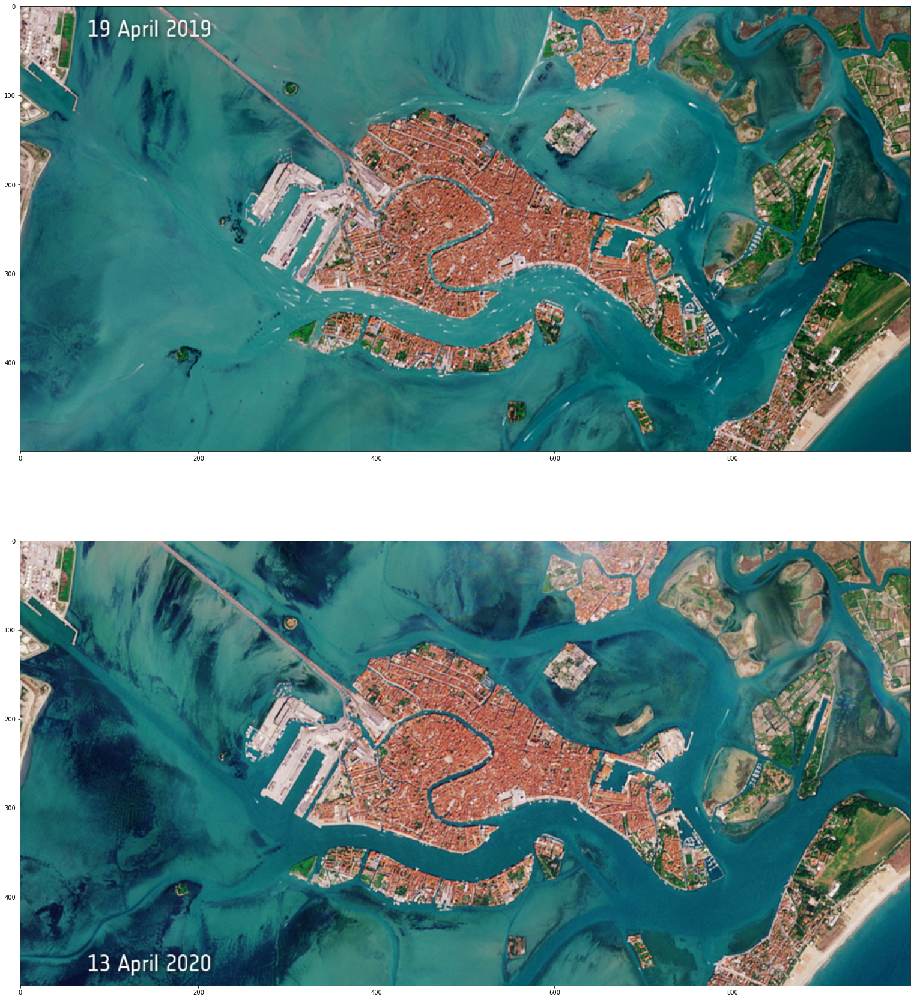

In [181]:
# Display
def bgr_to_rgb(img):
    b,g,r = cv2.split(img)
    return cv2.merge([r,g,b])

rgb1, rgb2 = bgr_to_rgb(im1), bgr_to_rgb(im2)
plt.figure(figsize=(60, 30))
plt.subplot(2, 1, 1)
plt.imshow(rgb1)
plt.subplot(2, 1, 2)
plt.imshow(rgb2)

## Segmentation de la date

In [5]:
def getFirstLastWhitePixel(img):
    topleft = (len(img),len(img))
    botright = (0,0)
    foundFirst = False
    for i, y in enumerate(img):
        for j, x in enumerate(y):
            if x == 255:
                topleft = (min(i, topleft[0]), min(j, topleft[1]))
                botright = (max(i, botright[0]), max(j, botright[1]))
    return (topleft, botright)

In [178]:
def dateSeg(img):
    plt.figure(figsize=(100,50))
    copy = img.copy()
    gray = cv2.cvtColor(copy, cv2.COLOR_RGB2GRAY)
    ret, thresh = cv2.threshold(gray, 250, 255, cv2.THRESH_BINARY)

    thresh = skimage.morphology.closing(thresh, skimage.morphology.square(100))
    contours, hierarchy = cv2.findContours(thresh, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
    
    x, y, w, h = -1, -1, -1, -1
    for c in contours:
        tx,ty,tw,th = cv2.boundingRect(c)
        if (x, y, w, h) == (-1, -1, -1, -1):
            x, y, w, h = tx,ty,tw,th
        if tw>w and th>h:
            x, y, w, h = tx,ty,tw,th
    new_img=img[y-5:y+h+5,x-5:x+w+5]
    plt.imshow(new_img)
    

[array([[[450, 317]]], dtype=int32), array([[[332, 210]]], dtype=int32), array([[[ 80,  17]],

       [[ 79,  18]],

       [[ 78,  18]],

       [[ 78,  33]],

       [[125,  33]],

       [[126,  34]],

       [[126,  38]],

       [[126,  34]],

       [[127,  33]],

       [[210,  33]],

       [[212,  31]],

       [[212,  19]],

       [[210,  17]]], dtype=int32)]
78 17 135 22


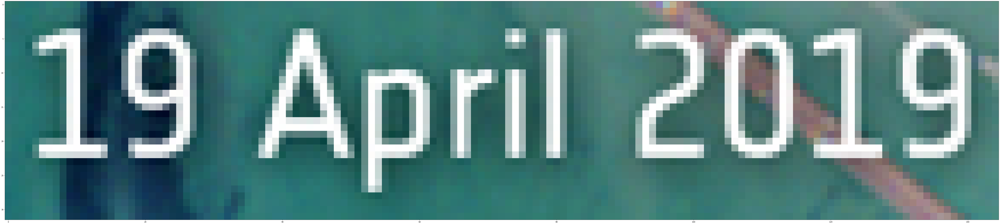

In [183]:
dateSeg(rgb1)

## Segmentation de l'eau

In [69]:
# Check average water color & color proportions
s = float(im1[150][300][0]) + im1[150][300][1] + im1[150][300][2]
print(im1[150][300], im1[150][300][0] / s, im1[150][300][1] / s, im1[150][300][2] / s)  # Clear

s = float(im1[5][300][0]) + im1[5][300][1] + im1[5][300][2]
print(im1[5][300], im1[5][300][0] / s, im1[5][300][1] / s, im1[5][300][2] / s) # Less clear

s = float(im1[300][0][0]) + im1[300][0][1] + im1[300][0][2]
print(im1[300][0], im1[300][0][0] / s, im1[300][0][1] / s, im1[300][0][2] / s) # Dark

s = float(im1[490][975][0]) + im1[490][975][1] + im1[490][975][2]
print(im1[490, 975], im1[490][975][0] / s, im1[490][975][1] / s, im1[490][975][2] / s)

s = float(im1[490][975][0]) + im1[490][975][1] + im1[490][975][2]
print(im2[490][975], im1[490][975][0] / s, im1[490][975][1] / s, im1[490][975][2] / s)

s = float(im1[10][570][0]) + im1[10][570][1] + im1[10][570][2]
print(im1[10][570], im1[10][570][0] / s, im1[10][570][1] / s, im1[10][570][2] / s)

s = float(im1[50][570][0]) + im1[50][570][1] + im1[50][570][2]
print(im1[50][570], im1[50][570][0] / s, im1[50][570][1] / s, im1[50][570][2] / s)

s = float(im2[499][55][0]) + im2[499][55][1] + im2[499][55][2]
print(im2[499][55], im2[499][55][0] / s, im2[499][55][1] / s, im2[499][55][2] / s)

s = float(im1[260][940][0]) + im1[260][940][1] + im1[260][940][2]
print(im1[260][940], im1[260][940][0] / s, im1[260][940][1] / s, im1[260][940][2] / s)

s = float(im2[230][90][0]) + im2[230][90][1] + im2[230][90][2]
print(im2[230][90], im2[230][90][0] / s, im2[230][90][1] / s, im2[230][90][2] / s)

[114  98  39] 0.4541832669322709 0.3904382470119522 0.1553784860557769
[126 134  81] 0.36950146627565983 0.39296187683284456 0.2375366568914956
[92 83 15] 0.4842105263157895 0.4368421052631579 0.07894736842105263
[80 64  0] 0.5555555555555556 0.4444444444444444 0.0
[95 69  3] 0.5555555555555556 0.4444444444444444 0.0
[135 132  64] 0.4078549848942598 0.3987915407854985 0.1933534743202417
[131 135  59] 0.40307692307692305 0.4153846153846154 0.18153846153846154
[45 13  7] 0.6923076923076923 0.2 0.1076923076923077
[75 59  0] 0.5597014925373134 0.44029850746268656 0.0
[60 41 14] 0.5217391304347826 0.3565217391304348 0.12173913043478261


In [106]:
def is_water(px):
    """
    For BGR pixel
    """
    cond1 = px[0] > 60 and px[1] > 50 and px[2] < 90
    cond2 = px[0] > 40 and px[1] < 50 and px[2] < 20
    cond3 = px[0] > 30 and px[1] < 30 and px[2] < 15
    cond4 = px[0] > 50 and px[1] < 90 and px[2] < 25
    return cond1 or cond2 or cond3 or cond4

In [107]:
def get_water(img):
    water = np.zeros((img.shape[0], img.shape[1]))
    for x in range(img.shape[0]):
        for y in range(img.shape[1]):
            if is_water(img[x][y]):
                water[x][y] = 1
    return water


water1 = get_water(im1)
water2 = get_water(im2)

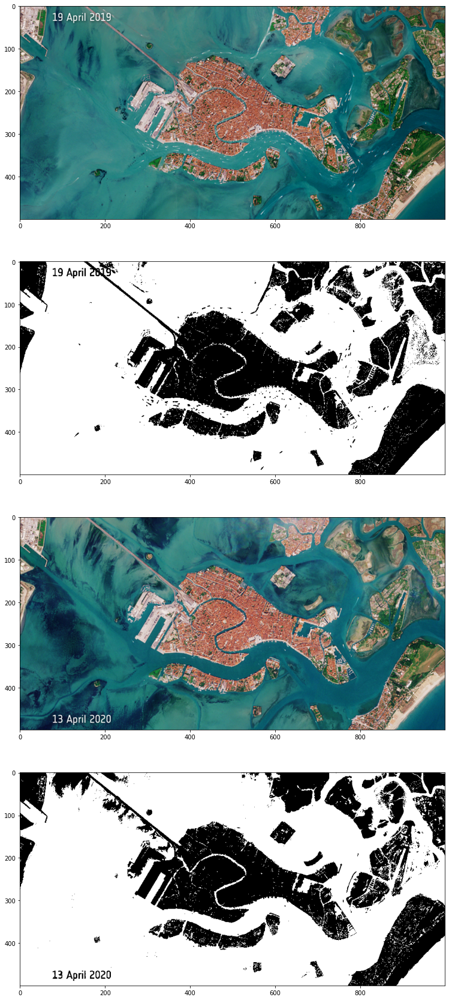

In [108]:
plt.figure(figsize=(60, 30))
plt.subplot(4, 1, 1)
plt.imshow(rgb1)
plt.subplot(4, 1, 2)
plt.imshow(water1, cmap="gray")
plt.subplot(4, 1, 3)
plt.imshow(rgb2)
plt.subplot(4, 1, 4)
plt.imshow(water2, cmap="gray")

## On compte les bateaux

Les bateaux font partie des éléments qui ne restent pas d'une image à l'autre. Comprendre : à une position donnée, la probabilité d'avoir un bateau sur les deux images est très faible. On peut donc travailler sur les différences entre les deux images. Voici notre plan d'attaque :

- Calcul de `abs(im2 - im1)` en niveaux de gris
    - Les zones claires constituent de grands écarts entre `im1` et `im2`
    - Les zones foncées constituent l'absence de différence entre `im1` et `im2`
- Binarisation, par seuillage, du résultat
    - On obtient un ensemble d'objets "différences" sur un fond noir
- Discrimination des objets : bateau ou pas bateau ?
    - Forme, taille, position relative à l'eau
- Bateau dans `im1` ou `im2` ?
    - Comparaison `im1`/`im2` à la position étudiée

### Pré-traitement

In [14]:
def preprocess(img):
    img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    # img = cv2.equalizeHist(img)
    return img.astype(np.int16)  # Because uint8 won't allow negatives when we im2-im1


processed_im1, processed_im2 = preprocess(im1), preprocess(im2)

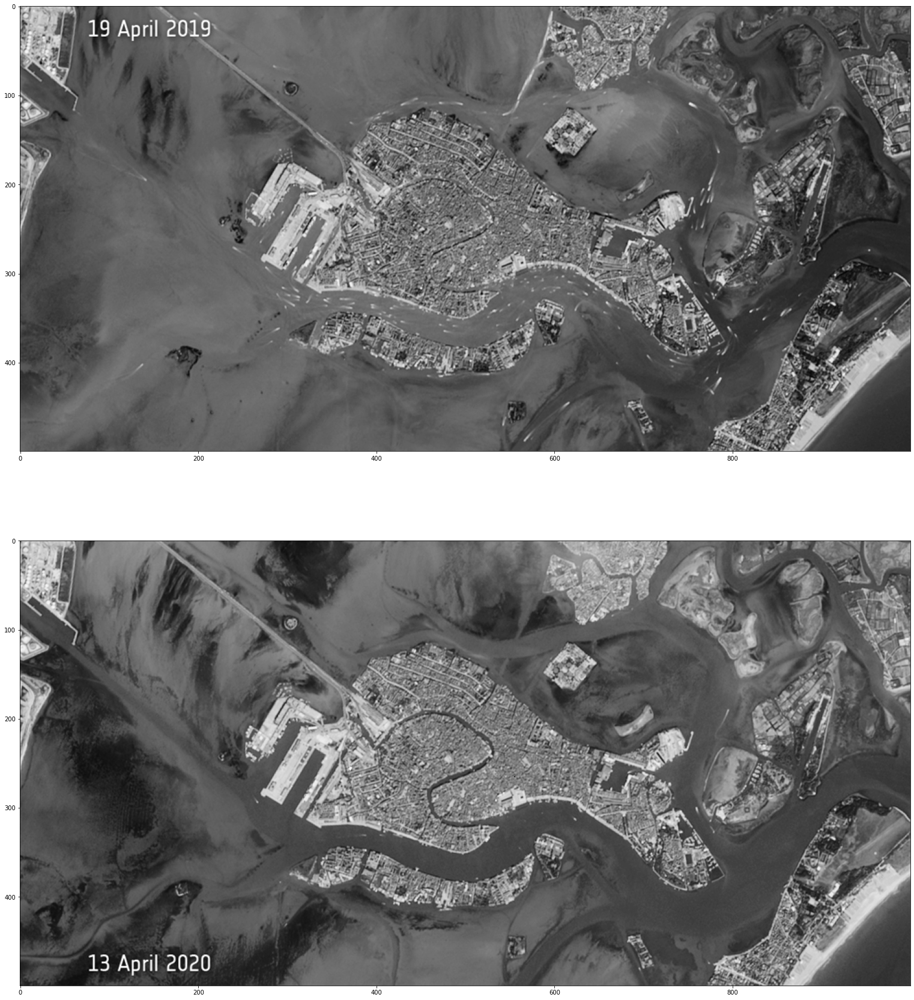

In [15]:
# Display
plt.figure(figsize=(60, 30))
plt.subplot(2, 1, 1)
plt.imshow(processed_im1, cmap="gray")
plt.subplot(2, 1, 2)
plt.imshow(processed_im2, cmap="gray")

### Différence entre `im1` et `im2`

Essayons différentes méthodes.

In [19]:
# Différence entre les deux niveaux de gris
diff = np.absolute(processed_im2 - processed_im1)

# Distance euclidienne (dans R^3) pixel à pixel
dist_rgb = np.apply_along_axis(
    np.linalg.norm,
    axis=2,
    arr=im2-im1
)

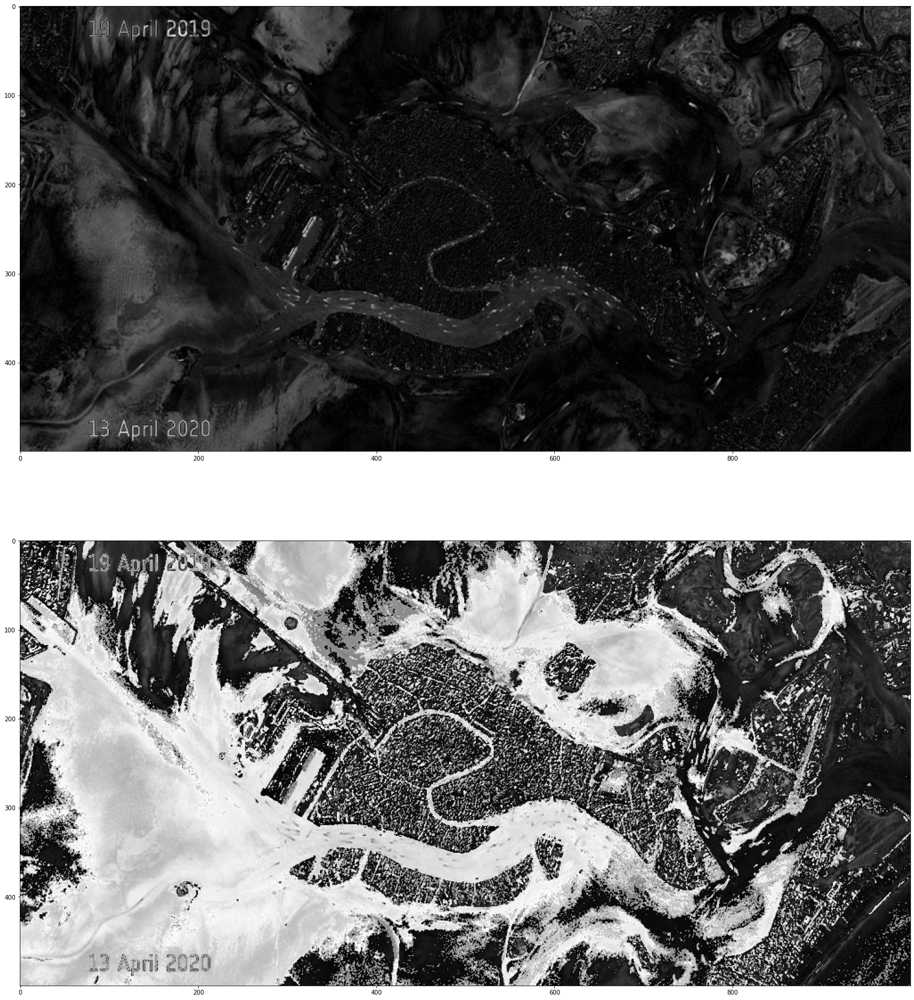

In [26]:
# Display
plt.figure(figsize=(60, 30))
plt.subplot(2, 1, 1)
plt.imshow(diff, cmap="gray")
plt.subplot(2, 1, 2)
plt.imshow(dist_rgb, cmap="gray")

**Problème** : dans les deux cas, certains bateaux apparaissent en foncé, et d'autres en clair.

En effet, sur certaines zones, la changement eau claire -> eau foncée est plus fort que le changement eau claire -> bateau (blanc).

**Idée** : c'est là que la segmentation de l'eau peut nous être utile : en sachant où se situe l'eau sur les deux images, nous pouvons considérer qu'un passage d'eau à eau ne constitue pas de changement, et donc mettre les pixels pertinents à 0.

In [114]:
def cancel_water(diff, water1, water2):
    new_diff = np.zeros(diff.shape)
    for x in range(diff.shape[0]):
        for y in range(diff.shape[1]):
            if water1[x][y] and water2[x][y]:
                new_diff[x][y] = 0
            else:
                new_diff[x][y] = diff[x][y]
    return new_diff

new_diff = cancel_water(diff, water1, water2)
other_diff = cancel_water(dist_rgb, water1, water2)

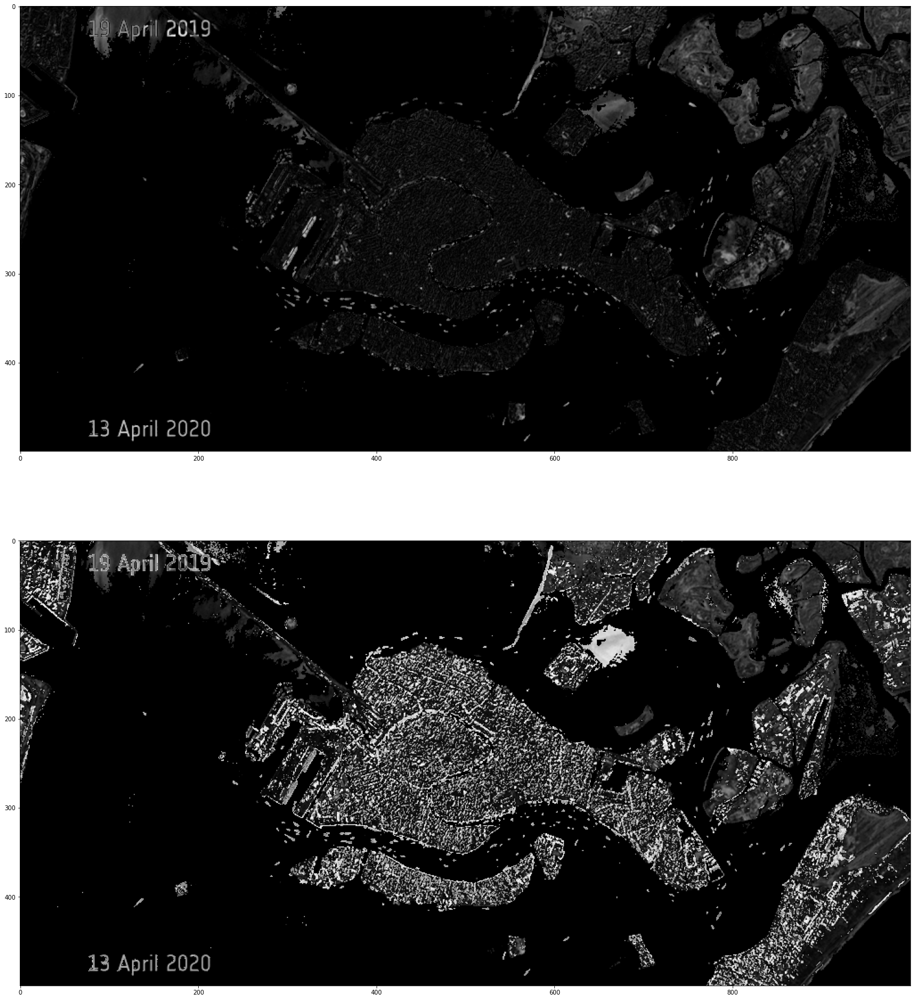

In [115]:
# Display
plt.figure(figsize=(60, 30))
plt.subplot(2, 1, 1)
plt.imshow(new_diff, cmap="gray")
plt.subplot(2, 1, 2)
plt.imshow(other_diff, cmap="gray")

### Seuillage

On essaie, pour le moment, avec des seuils choisis à la main, mais l'objectif sera d'utiliser les tests d'hypothèses pour choisir un seuil optimal.

In [15]:
# Bateaux clairs
# thresh1 = diff > 50

# Bateaux foncés
# thresh2 = diff < 15

In [16]:
# Display
# plt.figure(figsize=(60, 30))
# plt.subplot(2, 1, 1)
# plt.imshow(thresh1, cmap="gray")
# plt.subplot(2, 1, 2)
# plt.imshow(thresh2, cmap="gray")